# Задача 6. Компьютерное зрение: задача сегментации

### Обучаем Сегментацию:

- https://colab.research.google.com/drive/1eUIOnLFB_9_6CJ3dVZxY9TV_gCqDAmaV?authuser=1#scrollTo=SjKfL5X_RbzH --- тут мы обучали на большом датасете одну эпоху.
- https://drive.google.com/file/d/11wp4Bm-hEVwmZq8GmqbLpKpJiqvDSNAe/view?usp=sharing --- тут лежит датасет который мы будем использовать.

### Мы хотим обучить наш unet на небольшом датасете. Нужно заполнить репорт и сделать выводы. Чтобы успеть сделать много экспериментов нужна видеокарта. Можно использовать colab, тут есть бесплатные gpu ресурсы --- так будет быстрее.

- Сделать train/test split (или кросс-валидацию), зафиксировать все сиды чтобы более-менее воспроизводились результаты. Добавить метрику jaccard index. Переобучиться на одном батче (например 4 картинки), попробовать получить почти идеальное качество, посмотреть получилось или нет. Посчитать метрики для батча и для теста. Обучить на всем train, построить train/val кривые для loss и для jaccard index, подобрать оптимальное время обучения (количество шагов) для фиксированных параметров. Визуализировать topN самых плохих предсказаний.
- Попробовать улучшить качество не меняя архитектуру: аугментации, гиперпараметры. Сделать test time аугментации через horizontal flip, посмотреть улучшается ли что-то.
- Попробовать улучшить качество изменяя архитектуру.
- (+2 балла) Сделать train/test разбиение. Внутри train сделать 5fold, обучить 5 моделей. Построить кривые обучения для каждого фолда. Предсказать тест со всех 5 моделей и сагрегировать предсказания (до расчета метрик), сравнить с одной моделью обученной на всех данных. Сравнить с моделями обученными на фолдах. Сравнить плохие предсказания теста на разных фолдах. Ошибается на одних и тех же семплах или на разных?
- (+3 балла) Сделать unet с pretrained энкодером (можно взять vgg или resnet18/34), сравнить с предыдущими пунктами.


In [2]:
!nvidia-smi

Fri Jun 20 02:01:50 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   45C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
!pip install -q torch torchvision torchsummary torchmetrics albumentations segmentation-models-pytorch timm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 105.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.6/962.6 kB 62.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 13.6 MB/s eta 0:00:00


In [4]:
!gdown --id 11wp4Bm-hEVwmZq8GmqbLpKpJiqvDSNAe
!unzip -q dataset.zip
!ls '/content/dataset'

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=11wp4Bm-hEVwmZq8GmqbLpKpJiqvDSNAe
From (redirected): https://drive.google.com/uc?id=11wp4Bm-hEVwmZq8GmqbLpKpJiqvDSNAe&confirm=t&uuid=d8cadc76-fc92-4371-bc7a-525c348ff78b
To: /content/dataset.zip
100% 154M/154M [00:03<00:00, 42.8MB/s]
images	masks


In [5]:
import gc
import os
import random

from copy import copy

import torch
import pandas as pd
import seaborn as sns

from torch import nn
from torch.utils.data import Dataset
from torchvision import io
from torchvision.transforms import functional
from torchvision import transforms
from torchmetrics import JaccardIndex
from torch.utils.data import DataLoader, Subset
from matplotlib import pyplot as plt
from tqdm.auto import tqdm, trange

In [6]:
class BaseDataset(Dataset):
    def __init__(self, images, masks):
      assert (len(images) == len(masks))
      self.images = images
      self.masks = masks

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        image = io.read_image(str(self.images[index])) / 255
        mask = io.read_image(str(self.masks[index])) / 255
        return image, mask

Train size: 400
Test size: 1600
torch.Size([3, 800, 600])
torch.Size([1, 800, 600])


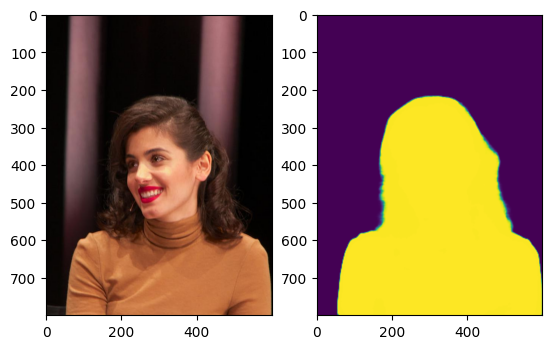

In [7]:
def get_files(dir):
    files = [os.path.join(dir, f) for f in os.listdir(dir) if os.path.isfile(os.path.join(dir, f))]
    return sorted(files)

def load_datasets():
    images_path = "dataset/images"
    masks_path = "dataset/masks"
    images = get_files(images_path)
    masks = get_files(masks_path)
    train_size = int(len(images) * 0.8)
    train_dataset = BaseDataset(images[train_size:], masks[train_size:])
    test_dataset = BaseDataset(images[:train_size], masks[:train_size])

    print("Train size:", len(train_dataset))
    print("Test size:", len(test_dataset))

    return train_dataset, test_dataset

train_dataset, test_dataset = load_datasets()

image, mask = train_dataset[42]

print(image.shape)
print(mask.shape)

fig, ax = plt.subplots(1, 2)
ax[0].imshow(functional.to_pil_image(image))
ax[1].imshow(functional.to_pil_image(mask))

In [8]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

torch.manual_seed(42);
random.seed(42);

# U-Net

In [9]:
class DoubleConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, padding):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.double_conv(x)



In [10]:
class Encoder(nn.Module):
    def __init__(self, in_channels, n_down, channels_factor= 2, padding = 1):
        super().__init__()

        self.enc_layers = nn.ModuleList([DoubleConvBlock(in_channels, in_channels * channels_factor, padding)])
        for _ in range(n_down):
            in_channels *= channels_factor
            self.enc_layers.append(
                nn.Sequential(
                    nn.MaxPool2d(2, 2),
                    DoubleConvBlock(in_channels, in_channels * channels_factor, padding),
                )
            )

    def forward(self, x: torch.Tensor) -> list[torch.Tensor]:
        results = []
        for layer in self.enc_layers:
            x = layer(x)
            results.append(x)
        return results


class Decoder(nn.Module):
    def __init__(self, in_channels, n_up, channels_divisor = 2, padding = 1):
        super().__init__()

        self.dec_layers = nn.ModuleList()
        for _ in range(n_up):
            out_channels = in_channels // channels_divisor
            self.dec_layers += [
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
                DoubleConvBlock(in_channels, out_channels, padding),
            ]
            in_channels = out_channels

    def forward(self, x: torch.Tensor, residuals: list[torch.Tensor]) -> torch.Tensor:
        assert len(residuals) == len(self.dec_layers) // 2
        for (up_conv, double_conv), residual in zip(zip(self.dec_layers[::2], self.dec_layers[1::2]), residuals[::-1]):
            x = up_conv(x)

            h_diff = residual.size(dim=2) - x.size(dim=2)
            assert 0 <= h_diff <= 1
            w_diff = residual.size(dim=3) - x.size(dim=3)
            assert 0 <= w_diff <= 1
            if h_diff > 0 or w_diff > 0:
                x = nn.functional.pad(x, [0, w_diff, 0, h_diff])

            x = torch.cat([residual, x], dim=1)

            x = double_conv(x)
        return x

In [11]:
class UNet(nn.Module):
    def __init__(self, in_channels = 3, out_channels = 1, n_levels = 4):
        super().__init__()
        self.encoder = Encoder(in_channels=in_channels, n_down=n_levels)
        self.decoder = Decoder(in_channels=in_channels * (2 ** (n_levels + 1)), n_up=n_levels)
        self.out_conv = nn.Conv2d(in_channels=in_channels * 2, out_channels=out_channels, kernel_size=1, padding=0)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        *residuals, x = self.encoder(x)
        x = self.decoder(x, residuals)
        x = self.out_conv(x)
        return x

In [12]:
loss_fn = nn.BCEWithLogitsLoss()
jaccard_fn = JaccardIndex(task="binary")

In [13]:
def validate(model, loader):
    model.eval()

    overall_loss = 0
    metric_sum = 0
    for X, y in tqdm(loader):
        X, y = X.to(device), y.to(device)
        pred = model(X)
        overall_loss += loss_fn(pred, y).item()
        metric_sum += jaccard_fn(pred.cpu(), y.cpu() > jaccard_fn.threshold).item()

    return overall_loss / len(loader), metric_sum / len(loader)

def train_epoch(model, optimizer, loader):
    model.train()

    overall_loss = 0
    metric_sum = 0

    for X, y in tqdm(loader):
        X, y = X.to(device), y.to(device)

        pred = model(X)
        loss = loss_fn(pred, y)
        metric = jaccard_fn(pred.cpu(), y.cpu() > jaccard_fn.threshold)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        overall_loss += loss.item()
        metric_sum += metric.item()

    return overall_loss / len(loader), metric_sum / len(loader)

def train(model, optimizer, train_loader, test_loader, epochs, weights_save_dir):
    stats = []

    for epoch_i in trange(epochs, desc="Epoch"):
        loss_train, metric_train = train_epoch(model, optimizer, train_loader)

        loss_test, metric_test = validate(model, test_loader)
        stats += [
            (epoch_i, "Loss", "Train", loss_train),
            (epoch_i, "Jaccard", "Train", metric_train),
            (epoch_i, "Loss", "Test", loss_test),
            (epoch_i, "Jaccard", "Test", metric_test),
        ]
        if (weights_save_dir is not None):
            torch.save(model.state_dict(), f"{weights_save_dir}/weights_{epoch_i}.bin")

    return pd.DataFrame(stats, columns=["Epoch", "Statistic", "Dataset", "Value"])

In [14]:
def plot_statistics(stats, title):
    figure, (loss_axis, jaccard_index_axis) = plt.subplots(nrows=2, sharex=True, figsize=(16, 8))
    sns.lineplot(
        stats[stats["Statistic"] == "Loss"],
        x="Epoch",
        y="Value",
        hue="Dataset",
        marker="o",
        ax=loss_axis,
    )

    sns.lineplot(
        stats[stats["Statistic"] == "Jaccard"],
        x="Epoch",
        y="Value",
        hue="Dataset",
        marker="o",
        ax=jaccard_index_axis,
    )

    jaccard_index_axis.set_title("Jaccard index")
    loss_axis.set_title("Loss")

    figure.suptitle(title)

In [15]:
batch_size = 4

train_loader = DataLoader(Subset(train_dataset, range(batch_size)), batch_size=batch_size)
test_loader = DataLoader(Subset(test_dataset, range(batch_size)), batch_size=batch_size)

In [ ]:
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters())

stats = train(model, optimizer, train_loader, test_loader, 50, None)

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

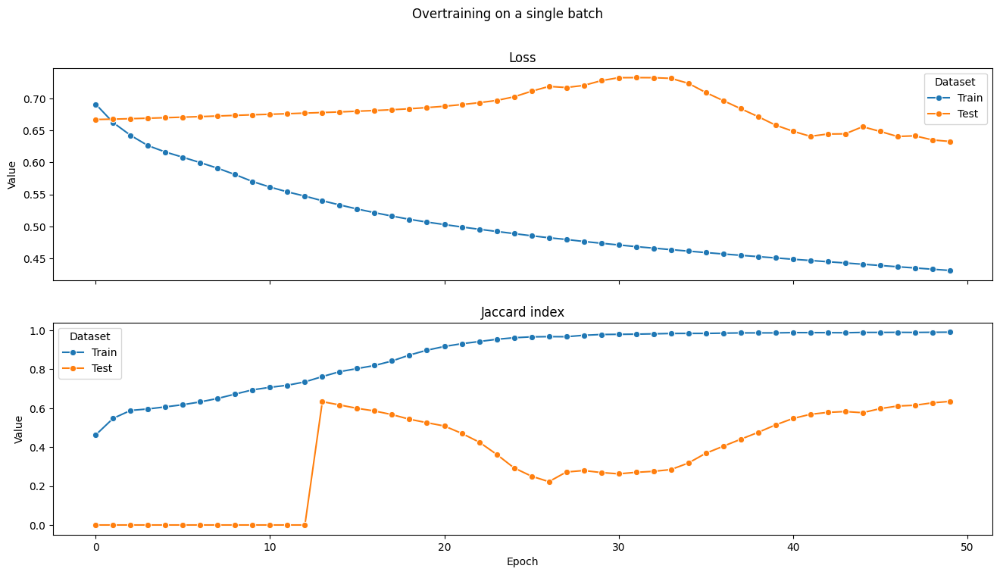

In [ ]:
plot_statistics(stats, "Overtraining on a single batch")

In [16]:
def show_prediction(entry):
    model.eval()
    X = entry[0].to(device).unsqueeze(0)
    pred = model(X)[0].cpu()
    pred = nn.functional.sigmoid(pred)
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(functional.to_pil_image(entry[0]))
    ax[1].imshow(functional.to_pil_image(pred))

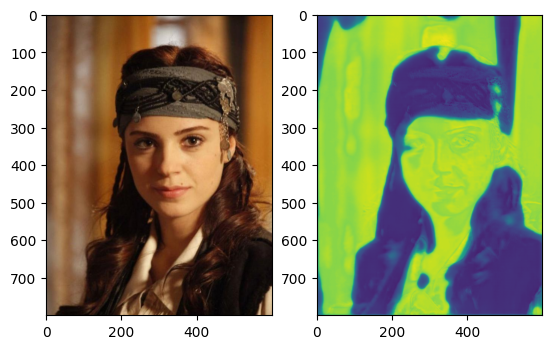

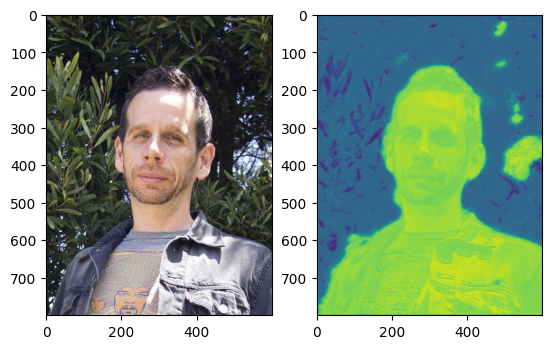

In [ ]:
def show_prediction(entry):
    model.eval()
    X = entry[0].to(device).unsqueeze(0)
    pred = model(X)[0].cpu()
    pred = nn.functional.sigmoid(pred)
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(functional.to_pil_image(entry[0]))
    ax[1].imshow(functional.to_pil_image(pred))


show_prediction(test_dataset[42])
show_prediction(train_dataset[0])

Для тренировачных данных получается давольно хорошо

Для тестовых получается не плохой результат

Так получается переобучение на одном батче

In [17]:
import gc
import torch

def free_gpu_mem():

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        print("Emptied CUDA cache")

    tensors_on_gpu = []
    for obj in gc.get_objects():
        try:
            if torch.is_tensor(obj) and obj.is_cuda:
                tensors_on_gpu.append((type(obj), obj.size()))
        except Exception as e:
            print(f"", end="")

    if tensors_on_gpu:
        print(f"Found {len(tensors_on_gpu)} tensors still on GPU:")
        for tensor_type, size in tensors_on_gpu[:5]:
            print(f"- {tensor_type} with size {size}")

    print("GPU memory cleanup completed")

def free_mem():
    gc.collect()

free_gpu_mem()

Emptied CUDA cache
GPU memory cleanup completed


/usr/local/lib/python3.11/dist-packages/torch/__init__.py:1113: FutureWarning: `torch.distributed.reduce_op` is deprecated, please use `torch.distributed.ReduceOp` instead
  return isinstance(obj, torch.Tensor)


# Обучение

In [ ]:
!mkdir initial
def train_initial_model():
    batch_size = 15

    train_loader = DataLoader(train_dataset, batch_size=batch_size)
    test_loader = DataLoader(test_dataset, batch_size=batch_size)

    weights_save_dir = "initial"

    free_gpu_mem()
    model = UNet().to(device)
    optimizer = torch.optim.Adam(model.parameters())

    stats = train(model, optimizer, train_loader, test_loader, 30, weights_save_dir)

    stats.to_csv("./initial_stats.csv")


if (not os.path.isfile("./initial_stats.csv")):
    train_initial_model()

mkdir: cannot create directory ‘initial’: File exists
Emptied CUDA cache
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.Prox

Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/107 [00:00<?, ?it/s]

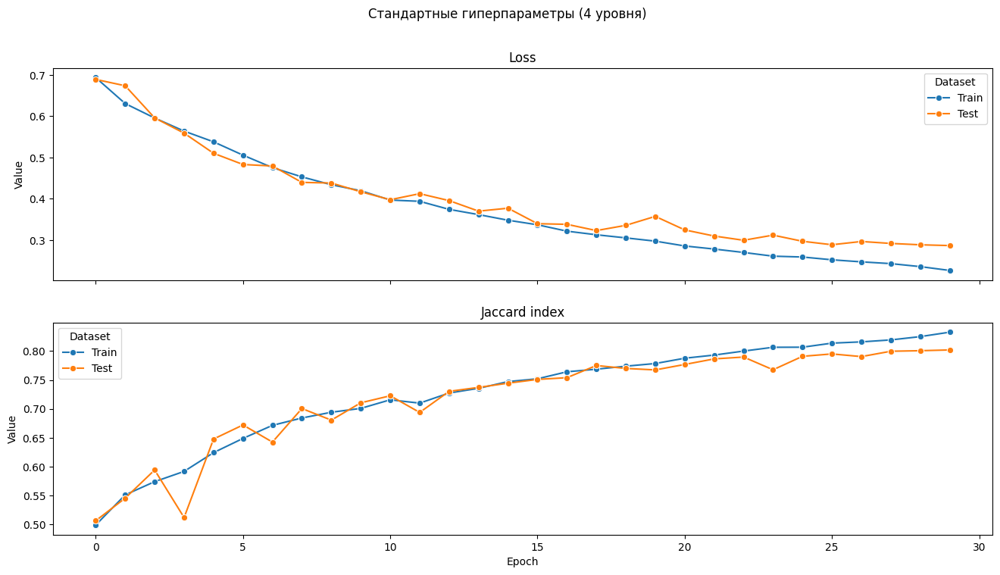

In [ ]:
plot_statistics(pd.read_csv("./initial_stats.csv"), "Стандартные гиперпараметры (4 уровня)")

In [18]:
def show_images(images):
    _, axes = plt.subplots(ncols=len(images))
    for index, image in enumerate(images):
        axes[index].imshow(functional.to_pil_image(image))
        axes[index].axis("off")
    plt.show()

@torch.no_grad
def pred_single(model, x):
    pred = model(x.to(device).unsqueeze(0))[0].cpu()
    sigma_pred = nn.functional.sigmoid(pred)
    del pred
    return sigma_pred

@torch.no_grad
def show_results_of_model(model, dataset=None):
    gc.collect()
    cropped_test_dataset = dataset
    answers = []
    model.eval();
    for i, (x, y) in enumerate(cropped_test_dataset):
        pred = model(x.to(device).unsqueeze(0))[0].cpu()
        jaccard = jaccard_fn(pred.cpu(), y.cpu() > jaccard_fn.threshold)
        answers.append((i, jaccard))
        del pred

    answers.sort(key=lambda x: -x[1])
    worst_two = answers[-3:-1:1]
    best_two = answers[0:2:1]
    between = [answers[int(len(answers) / 2)]]
    between.append(answers[int(len(answers) / 2) + 1])


    worst_images = [cropped_test_dataset[worst_two[0][0]][0], None, cropped_test_dataset[worst_two[1][0]][0], None]
    worst_images[1] = pred_single(model, cropped_test_dataset[worst_two[0][0]][0])
    worst_images[3] = pred_single(model, cropped_test_dataset[worst_two[1][0]][0])

    show_images(worst_images)

    middle_images = [cropped_test_dataset[between[0][0]][0], None, cropped_test_dataset[between[1][0]][0], None]
    middle_images[1] = pred_single(model, cropped_test_dataset[between[0][0]][0])
    middle_images[3] = pred_single(model, cropped_test_dataset[between[1][0]][0])

    show_images(middle_images)

    best_images = [cropped_test_dataset[best_two[0][0]][0], None, cropped_test_dataset[best_two[1][0]][0], None]
    best_images[1] = pred_single(model, cropped_test_dataset[best_two[0][0]][0])
    best_images[3] = pred_single(model, cropped_test_dataset[best_two[1][0]][0])

    show_images(best_images)

    for ans in range(len(answers)):
        try: del answers[ans]
        except Exception: pass

    gc.collect()

### Выбирем
- 2 худшие
- 2 средние
- 2 лучшиие

In [28]:
class SliceDataset(Dataset):
    def __init__(self, base_dataset, pick_begin, pick_end):
        self._base_dataset = base_dataset
        self._pick_begin = pick_begin
        self._pick_end = pick_end

    def __len__(self):
        return min(self._pick_end - self._pick_begin, len(self._base_dataset))

    def __getitem__(self, index):
        return self._base_dataset[self._pick_begin + index]

Emptied CUDA cache
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Sk

/usr/local/lib/python3.11/dist-packages/torch/__init__.py:1113: FutureWarning: `torch.distributed.reduce_op` is deprecated, please use `torch.distributed.ReduceOp` instead
  return isinstance(obj, torch.Tensor)


Train size: 400
Test size: 1600


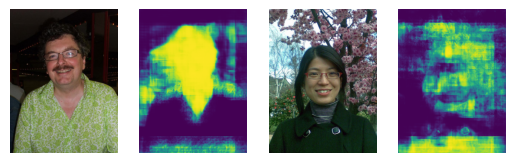

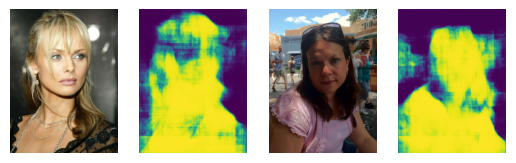

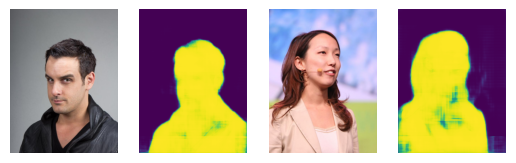

In [ ]:
free_gpu_mem()
free_mem()
model = UNet()
model.load_state_dict(torch.load(f"initial/weights_29.bin"))
model.to(device).eval()

class SliceDataset(Dataset):
    def __init__(self, base_dataset, pick_begin, pick_end):
        self._base_dataset = base_dataset
        self._pick_begin = pick_begin
        self._pick_end = pick_end

    def __len__(self):
        return min(self._pick_end - self._pick_begin, len(self._base_dataset))

    def __getitem__(self, index):
        return self._base_dataset[self._pick_begin + index]

train_dataset, test_dataset = load_datasets()

show_results_of_model(model, SliceDataset(test_dataset, 0, 100))

# Улучшения без изменения архитектуры

Добавим
- отражение по горизонтали
- небольшое изменение цвета и резкости картинки

In [19]:
filters_flip = [transforms.RandomHorizontalFlip(p=1)]
filters_color = [
    transforms.ColorJitter(brightness=.05, hue=.05, saturation=.05),
    transforms.RandomAdjustSharpness(sharpness_factor=6),
]

augmentations_flip = transforms.Compose(filters_flip)
augmentations_color = transforms.Compose(filters_color)

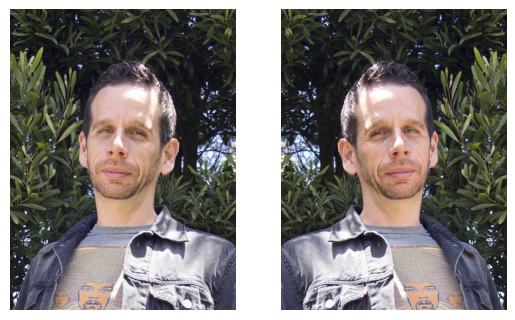

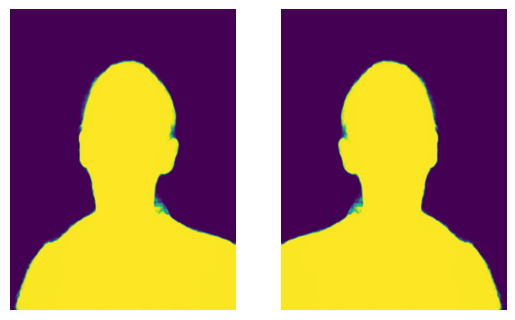

In [21]:
class AugmentedDataset(Dataset):
    def __init__(self, base_dataset, geometry_transform, color_transform):
        self._base_dataset = base_dataset
        self._gtransform = geometry_transform
        self._ctransform = color_transform

    def __len__(self):
        return len(self._base_dataset)

    def __getitem__(self, index):
        image, mask = self._base_dataset[index]
        return self._ctransform(self._gtransform(image)), self._gtransform(mask)

train_dataset_augmented = AugmentedDataset(train_dataset, augmentations_flip, augmentations_color)

image, mask = train_dataset[0]
augmented_image, augmented_mask = train_dataset_augmented[0]
show_images([image, augmented_image])
show_images([mask, augmented_mask])

train_dataset_full = torch.utils.data.ConcatDataset([train_dataset, copy(train_dataset)])

In [35]:
class AugmentedReinforcedInputModel(nn.Module):
    def __init__(self, base_model, geometry_transform):
        super().__init__()
        self._base_model = base_model
        self._transform = geometry_transform

    def forward(self, x):
        x = copy(x)
        x_transformed = self._transform(x)
        y = self._base_model(x)
        y_transformed = self._base_model(x_transformed)
        y_restored = self._transform(y_transformed)
        stacked = torch.stack([y, y_restored])
        means = torch.mean(stacked, dim=0)
        return means

In [ ]:
batch_size = 8
levels = [8]

train_loader_full = DataLoader(train_dataset_full, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

for num_levels in levels:
    if (os.path.isfile(f"model_{num_levels}_levels.csv")):
        print(f"model_{num_levels}_levels.csv is Already done")
        continue

    free_gpu_mem()
    weights_dir = f"weights/model_{num_levels}_level"
    model = UNet(n_levels=num_levels).to(device)
    optimizer = torch.optim.Adam(model.parameters())

    stats = train(model, optimizer, train_loader_full, test_loader, 25, weights_dir)
    stats.to_csv(f"model_{num_levels}_levels.csv")

for num_levels in levels:
    stats = pd.read_csv(f"model_{num_levels}_levels.csv")
    plot_statistics(stats, f"Модель с {num_levels} уровнями")

free_gpu_mem()
free_mem()
model = UNet(n_levels=8)
model.load_state_dict(torch.load(f"weights/model_8_level/weights_24.bin"))
model.to(device).eval();
ari_model = AugmentedReinforcedInputModel(model, augmentations_flip)

model_loss, model_jaccard = validate(model, test_loader)
ari_model_loss, ari_model_jaccard = validate(ari_model, test_loader)

print(f"Модель без декоратора: Loss: {model_loss:.3f}, Jaccard: {model_jaccard:.3f}")
print(f"Модель с декоратором: Loss: {ari_model_loss:.3f}, Jaccard: {ari_model_jaccard:.3f}")

show_results_of_model(model, SliceDataset(test_dataset, 0, 100))
show_results_of_model(ari_model, SliceDataset(test_dataset, 0, 100))


model_8_levels.csv is Already done
Emptied CUDA cache


/usr/local/lib/python3.11/dist-packages/torch/__init__.py:1113: FutureWarning: `torch.distributed.reduce_op` is deprecated, please use `torch.distributed.ReduceOp` instead
  return isinstance(obj, torch.Tensor)


Found 702 tensors still on GPU:
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([12, 6, 2, 2])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([1, 6, 1, 1])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6, 6, 3, 3])
GPU memory cleanup completed


  0%|          | 0/200 [00:00<?, ?it/s]

# Обучение
- Изменим количество уровней

In [22]:
!mkdir weights

In [38]:
!mkdir weights/model_2_level
!mkdir weights/model_4_level
!mkdir weights/model_6_level
!mkdir weights/model_8_level

Emptied CUDA cache
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Sk

Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Emptied CUDA cache
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Sk

Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

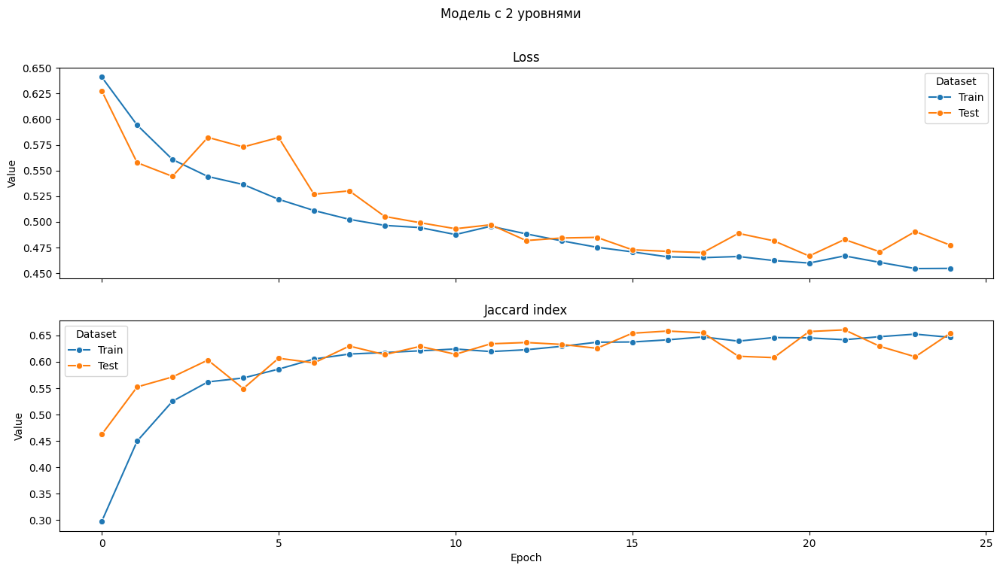

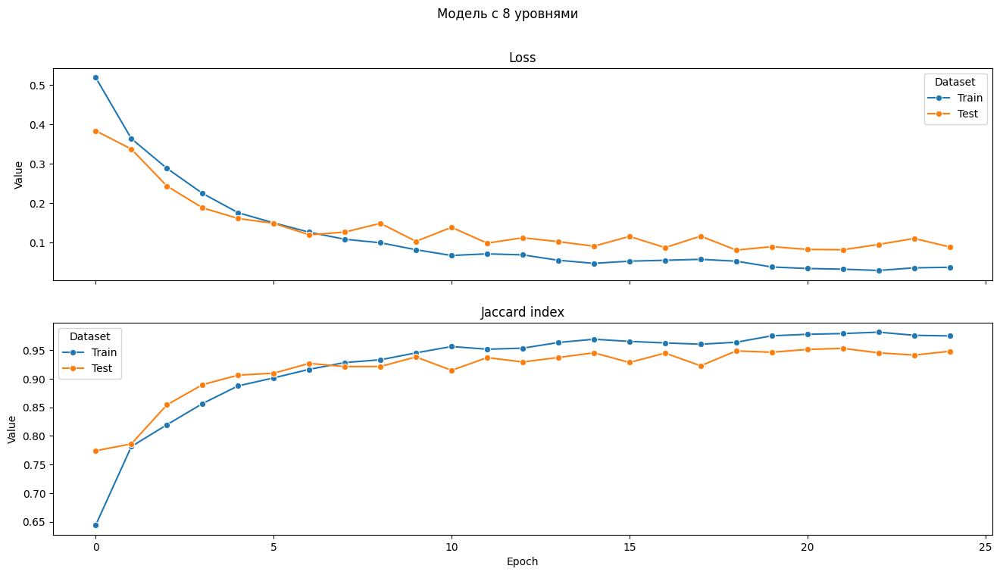

In [ ]:
batch_size = 8
levels = [2, 8]

train_loader_full = DataLoader(train_dataset_full, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

for num_levels in levels:
    if (os.path.isfile(f"model_{num_levels}_levels.csv")):
        print(f"model_{num_levels}_levels.csv is Already done")
        continue

    free_gpu_mem()
    weights_dir = f"weights/model_{num_levels}_level"
    model = UNet(n_levels=num_levels).to(device)
    optimizer = torch.optim.Adam(model.parameters())

    stats = train(model, optimizer, train_loader_full, test_loader, 25, weights_dir)
    stats.to_csv(f"model_{num_levels}_levels.csv")

for num_levels in levels:
    stats = pd.read_csv(f"model_{num_levels}_levels.csv")
    plot_statistics(stats, f"Модель с {num_levels} уровнями")

# Модель с 2 уровнями

Emptied CUDA cache
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Sk

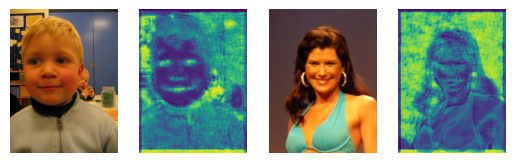

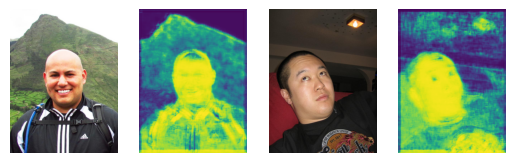

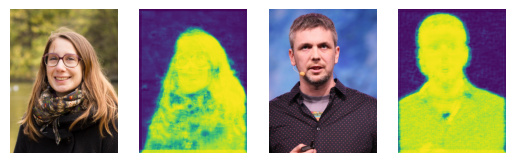

In [ ]:
free_gpu_mem()
free_mem()
model = UNet(n_levels=2)
model.load_state_dict(torch.load(f"weights/model_2_level/weights_24.bin"))
model.to(device).eval()
show_results_of_model(model, SliceDataset(test_dataset, 0, 100))

# Модель с 8 уровнями

Emptied CUDA cache
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Skipping object: <class 'weakref.ProxyType'> - weakly-referenced object no longer exists
Sk

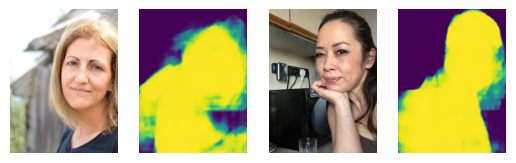

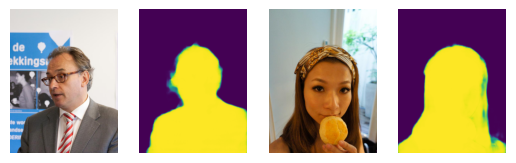

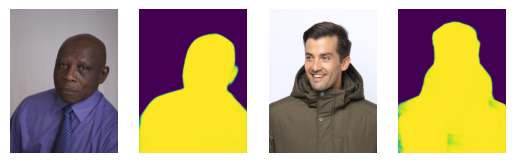

In [ ]:
free_gpu_mem()
free_mem()
model = UNet(n_levels=8)
model.load_state_dict(torch.load(f"weights/model_8_level/weights_24.bin"))
model.to(device).eval()
show_results_of_model(model, SliceDataset(test_dataset, 0, 100))

С увеличением количества уровней, получаются более правильные изображения

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Обучение с 5Fold


In [23]:
!mkdir weights
!mkdir weights/kfolds
!mkdir weights/kfolds/kfolds_0
!mkdir weights/kfolds/kfolds_1
!mkdir weights/kfolds/kfolds_2
!mkdir weights/kfolds/kfolds_3
!mkdir weights/kfolds/kfolds_4
!mkdir weights/kfolds/kfolds_5

mkdir: cannot create directory ‘weights’: File exists


In [33]:
from sklearn.model_selection import KFold

five_fold = KFold(n_splits=5)
batch_size = 8

for index, (train_indices, test_indices) in enumerate(five_fold.split(train_dataset)):
    if (os.path.isfile(f"kfold_{index}_stats.csv")): continue

    free_gpu_mem()
    model = UNet(n_levels=8)
    model = model.to(device)
    train_loader = DataLoader(Subset(train_dataset, train_indices), batch_size=batch_size)
    test_loader = DataLoader(Subset(test_dataset, test_indices), batch_size=batch_size)

    optimizer = torch.optim.Adam(model.parameters())
    stats = train(model, optimizer, train_loader, test_loader, 25, f"weights/kfolds/kfolds_{index}")
    stats.to_csv(f"kfold_{index}_stats.csv")


Emptied CUDA cache
Found 864 tensors still on GPU:
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([12, 6, 2, 2])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([1, 6, 1, 1])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6, 6, 3, 3])
GPU memory cleanup completed


/usr/local/lib/python3.11/dist-packages/torch/__init__.py:1113: FutureWarning: `torch.distributed.reduce_op` is deprecated, please use `torch.distributed.ReduceOp` instead
  return isinstance(obj, torch.Tensor)


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Emptied CUDA cache
Found 1168 tensors still on GPU:
- <class 'torch.Tensor'> with size torch.Size([6, 3, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6, 6, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
GPU memory cleanup completed


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Emptied CUDA cache
Found 1168 tensors still on GPU:
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([12, 6, 2, 2])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([1, 6, 1, 1])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6, 6, 3, 3])
GPU memory cleanup completed


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Emptied CUDA cache
Found 1168 tensors still on GPU:
- <class 'torch.Tensor'> with size torch.Size([6, 3, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6, 6, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
GPU memory cleanup completed


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Emptied CUDA cache
Found 1168 tensors still on GPU:
- <class 'torch.Tensor'> with size torch.Size([6, 3, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6, 6, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
GPU memory cleanup completed


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

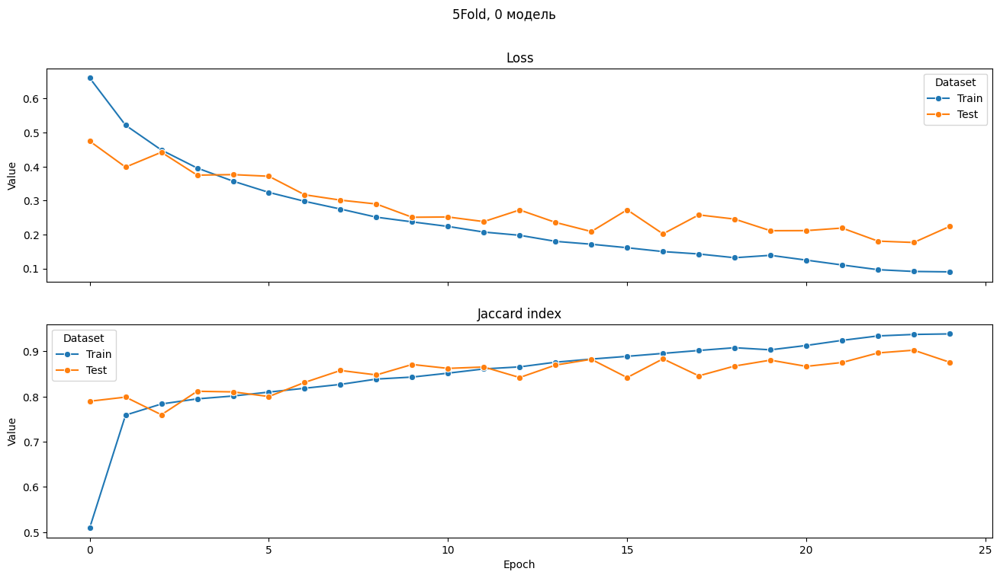

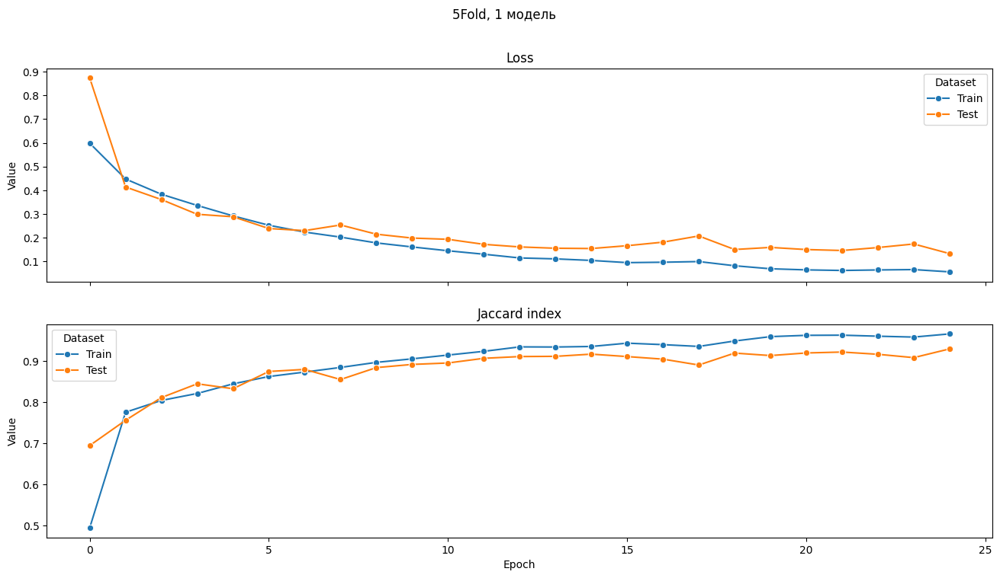

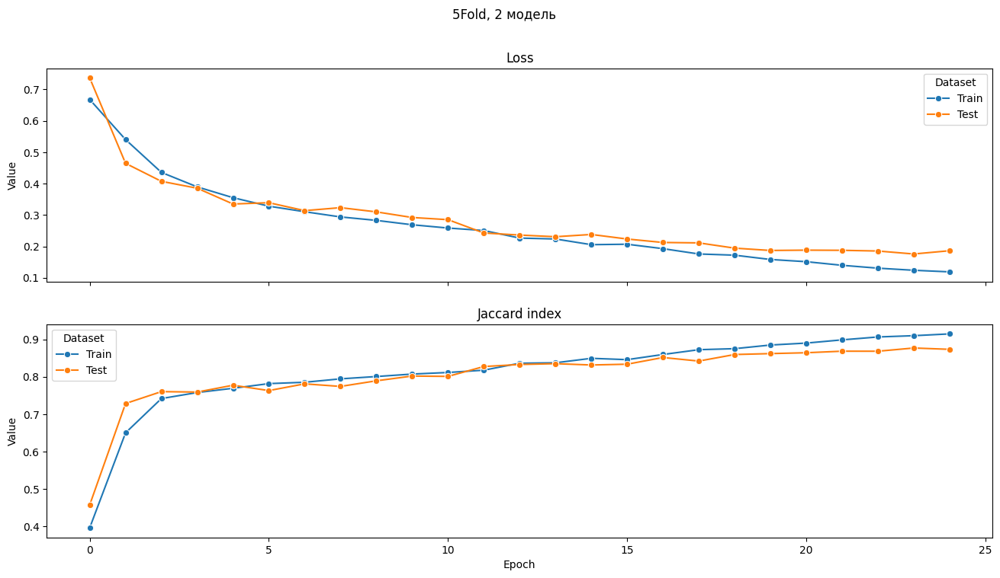

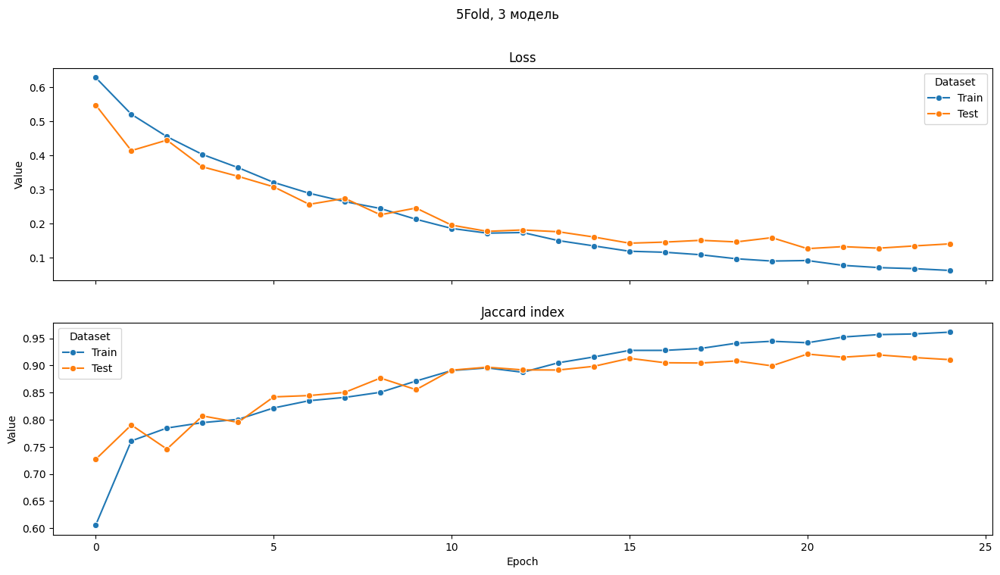

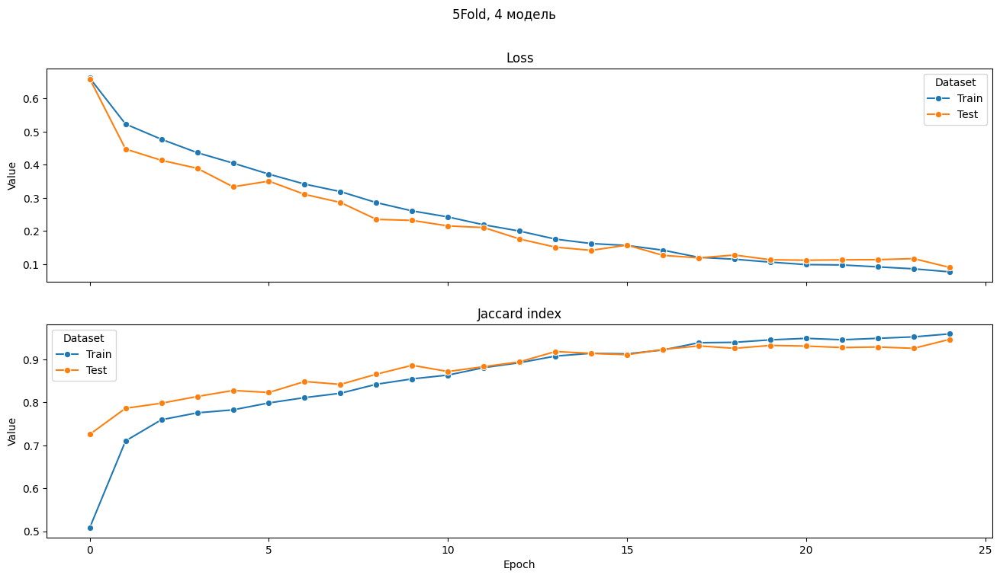

In [22]:
for index in range(5):
    stats = pd.read_csv(f"kfold_{index}_stats.csv")
    plot_statistics(stats, f"5Fold, {index} модель")

Emptied CUDA cache
Found 1168 tensors still on GPU:
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([12, 6, 2, 2])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([1, 6, 1, 1])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6, 6, 3, 3])
GPU memory cleanup completed


  0%|          | 0/200 [00:00<?, ?it/s]

5Folds, 0 модель: Loss: 0.121, Jaccard: 0.925


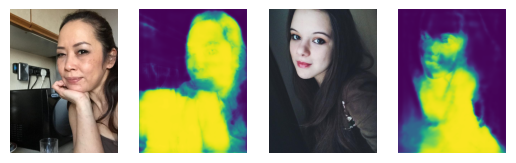

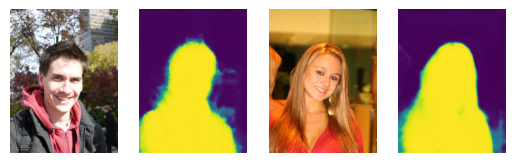

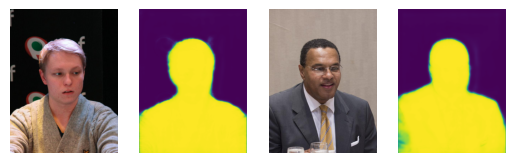

Emptied CUDA cache
Found 1168 tensors still on GPU:
- <class 'torch.Tensor'> with size torch.Size([6, 3, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6, 6, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
GPU memory cleanup completed


  0%|          | 0/200 [00:00<?, ?it/s]

5Folds, 1 модель: Loss: 0.129, Jaccard: 0.919


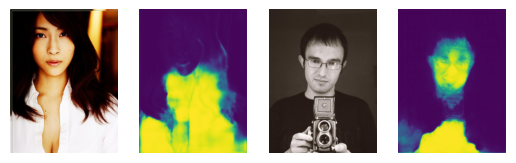

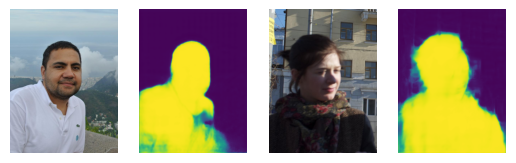

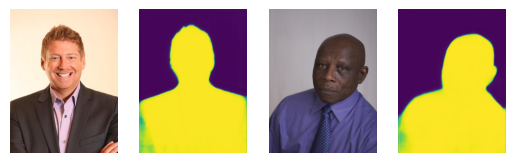

Emptied CUDA cache
Found 1388 tensors still on GPU:
- <class 'torch.Tensor'> with size torch.Size([6, 3, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6, 6, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
GPU memory cleanup completed


  0%|          | 0/200 [00:00<?, ?it/s]

5Folds, 2 модель: Loss: 0.126, Jaccard: 0.917


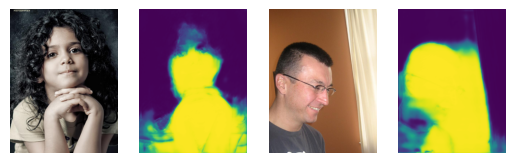

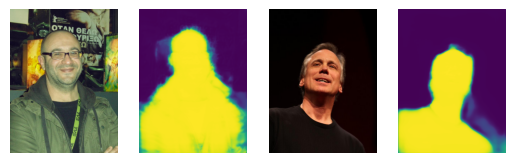

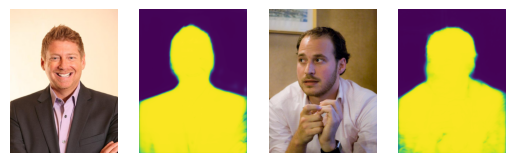

Emptied CUDA cache
Found 1388 tensors still on GPU:
- <class 'torch.Tensor'> with size torch.Size([6, 3, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6, 6, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
GPU memory cleanup completed


  0%|          | 0/200 [00:00<?, ?it/s]

5Folds, 3 модель: Loss: 0.142, Jaccard: 0.901


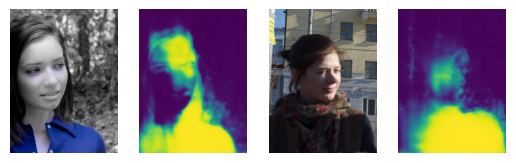

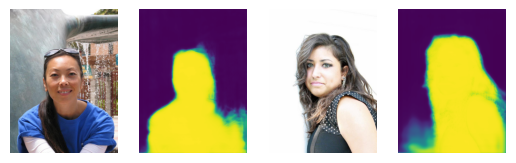

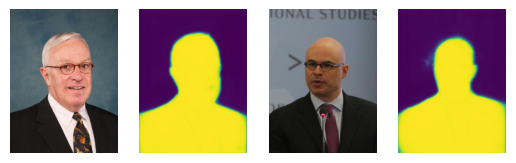

Emptied CUDA cache
Found 1388 tensors still on GPU:
- <class 'torch.Tensor'> with size torch.Size([6, 3, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6])
- <class 'torch.Tensor'> with size torch.Size([6, 6, 3, 3])
- <class 'torch.Tensor'> with size torch.Size([6])
GPU memory cleanup completed


  0%|          | 0/200 [00:00<?, ?it/s]

5Folds, 4 модель: Loss: 0.117, Jaccard: 0.925


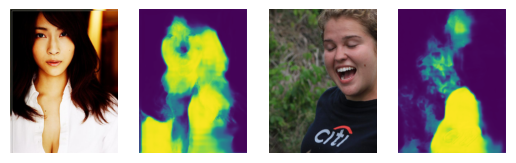

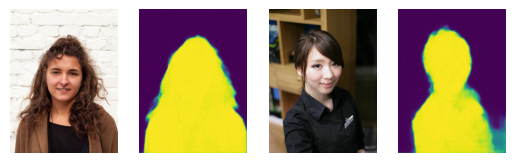

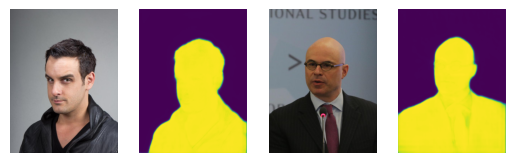

In [34]:
test_loader = DataLoader(test_dataset, batch_size=batch_size)

def test_and_print(weights, text):
    free_gpu_mem()
    free_mem()
    model = UNet(n_levels=8)
    model.load_state_dict(torch.load(weights))
    model.to(device).eval()
    model_loss, model_jaccard = validate(model, test_loader)
    print(f"{text}: Loss: {model_loss:.3f}, Jaccard: {model_jaccard:.3f}")
    show_results_of_model(model, SliceDataset(test_dataset, 0, 100))

test_and_print("weights/kfolds/kfolds_0/weights_24.bin", "5Folds, 0 модель")
test_and_print("weights/kfolds/kfolds_1/weights_24.bin", "5Folds, 1 модель")
test_and_print("weights/kfolds/kfolds_2/weights_24.bin", "5Folds, 2 модель")
test_and_print("weights/kfolds/kfolds_3/weights_24.bin", "5Folds, 3 модель")
test_and_print("weights/kfolds/kfolds_4/weights_24.bin", "5Folds, 4 модель")

Картинки со сложным фоном также вызывают проблемы

# Предобученная модель с ResNet34

In [24]:
!pip install segmentation-models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 5.1 MB/s eta 0:00:00


In [26]:
!mkdir weights/pretrained

In [29]:
import segmentation_models_pytorch as smp

class PaddedDataset(Dataset):
    def __init__(self, base_dataset):
        self._base_dataset = base_dataset
        self._transformation = transforms.Resize((800, 608))

    def __len__(self):
        return len(self._base_dataset)

    def __getitem__(self, index):
        image, mask = self._base_dataset[index]
        return self._transformation(image), self._transformation(mask)

def train_pretrained_encoder_model():
    batch_size = 8

    padded_train_dataset = PaddedDataset(train_dataset)
    padded_test_dataset = PaddedDataset(train_dataset)

    train_loader = DataLoader(padded_train_dataset, batch_size=batch_size)
    test_loader = DataLoader(padded_test_dataset, batch_size=batch_size)
    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights="imagenet",
        activation=None
    ).to(device)
    optimizer = torch.optim.Adam(model.parameters())

    stats = train(model, optimizer, train_loader, test_loader, 25, "weights/pretrained")

    stats.to_csv("./pretrained_stats.csv")


if (not os.path.isfile("./pretrained_stats.csv")):
    train_pretrained_encoder_model()

Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

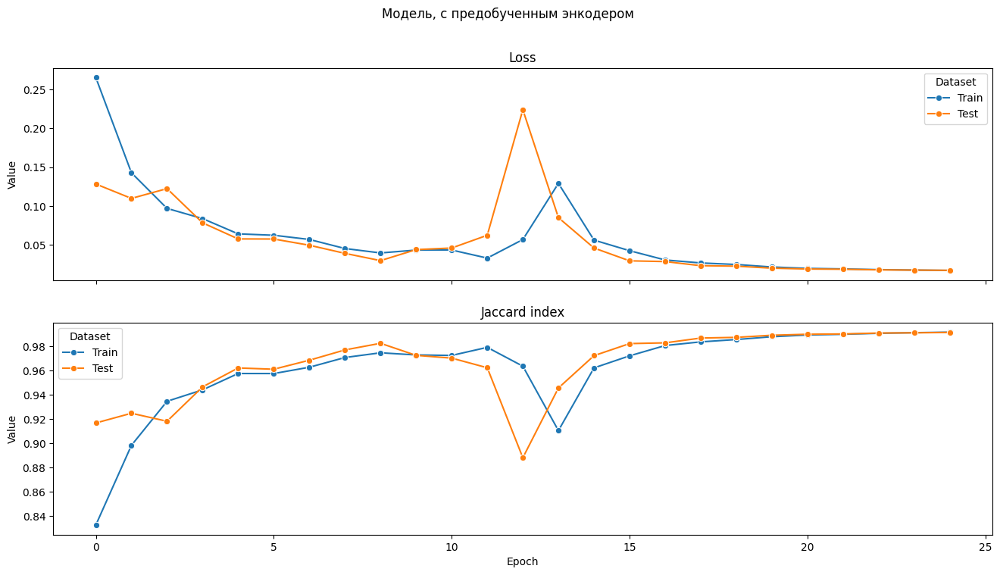

In [32]:
plot_statistics(pd.read_csv("./pretrained_stats.csv"), "Модель, с предобученным энкодером")

Emptied CUDA cache


/usr/local/lib/python3.11/dist-packages/torch/__init__.py:1113: FutureWarning: `torch.distributed.reduce_op` is deprecated, please use `torch.distributed.ReduceOp` instead
  return isinstance(obj, torch.Tensor)


Found 1288 tensors still on GPU:
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([96, 48, 3, 3])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6, 3, 3, 3])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6])
- <class 'torch.nn.parameter.Parameter'> with size torch.Size([6, 6, 3, 3])
GPU memory cleanup completed


  0%|          | 0/200 [00:00<?, ?it/s]

Предобученная модель: Loss: 0.057, Jaccard: 0.971


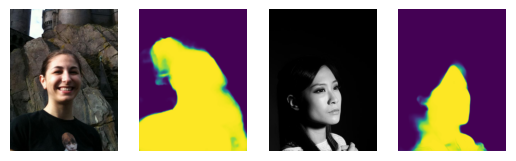

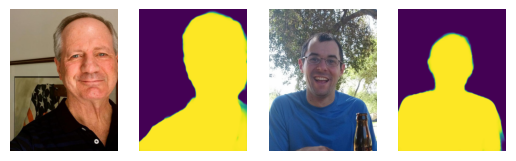

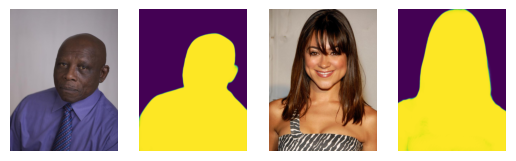

In [31]:
free_gpu_mem()
free_mem()
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    activation=None
).to(device)

model.load_state_dict(torch.load(f"weights/pretrained/weights_23.bin"))
model.to(device).eval();

padded_test_dataset = PaddedDataset(test_dataset)
test_loader = DataLoader(padded_test_dataset, batch_size=batch_size)
modified_model_loss, modified_model_jaccard = validate(model, test_loader)
print(f"Предобученная модель: Loss: {modified_model_loss:.3f}, Jaccard: {modified_model_jaccard:.3f}")

show_results_of_model(model, padded_test_dataset)

Предобученная модель показала лучшие результаты

Для всех моделей оказались общие проблемы со сложным фоном

Лучшей оказалась предобученная модель